In [1]:
import pandas as pd
import os
from datetime import datetime 
import re
import matplotlib.pyplot as plt

In [32]:
path="../scaled_data/"
file_list=os.listdir(path)

In [37]:
df=pd.DataFrame()
for file in file_list:    
    symbol=file.split("_")[1][:-4]
    tdf=pd.read_csv(path+file,index_col=0).iloc[:,4]
    tdf.rename(symbol,inplace=True)

    df=pd.concat([df,tdf],axis=1)

In [40]:
df.to_csv("min2max.csv")

In [52]:
# Author: Romain Tavenard
# License: BSD 3 clause

import numpy
import matplotlib.pyplot as plt

from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, \
    TimeSeriesResampler

seed = 0
numpy.random.seed(seed)
X_train, y_train, X_test, y_test = CachedDatasets().load_dataset("Trace")
X_train = X_train[y_train < 4]  # Keep first 3 classes
numpy.random.shuffle(X_train)
# Keep only 50 time series
X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train[:50])
# Make time series shorter
X_train = TimeSeriesResampler(sz=40).fit_transform(X_train)
sz = X_train.shape[1]

# Euclidean k-means
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=3, verbose=True, random_state=seed)
y_pred = km.fit_predict(X_train)


Euclidean k-means
16.434 --> 9.437 --> 9.437 --> 


In [53]:
X_train

array([[[ 0.70284807],
        [ 0.67041062],
        [ 0.66094803],
        ...,
        [ 0.58290225],
        [ 0.5847045 ],
        [ 0.59973054]],

       [[ 0.78424784],
        [ 0.76968207],
        [ 0.73637576],
        ...,
        [ 0.79215738],
        [ 0.77039311],
        [ 0.78639174]],

       [[-1.45424119],
        [-1.47859826],
        [-1.50492559],
        ...,
        [ 0.72844694],
        [ 0.72533128],
        [ 0.7094401 ]],

       ...,

       [[ 0.75458352],
        [ 0.78165687],
        [ 0.80198359],
        ...,
        [ 0.74927489],
        [ 0.7479381 ],
        [ 0.74485583]],

       [[-1.38201243],
        [-1.35633753],
        [-1.37303456],
        ...,
        [ 0.76888577],
        [ 0.81197286],
        [ 0.83448894]],

       [[ 0.66455793],
        [ 0.56782604],
        [ 0.65111839],
        ...,
        [ 0.55524164],
        [ 0.55725016],
        [ 0.56296336]]])

In [ ]:

plt.figure()
for yi in range(3):
    plt.subplot(3, 3, yi + 1)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

# DBA-k-means
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=3,
                          n_init=2,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=seed)
y_pred = dba_km.fit_predict(X_train)

for yi in range(3):
    plt.subplot(3, 3, 4 + yi)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")

# Soft-DTW-k-means
print("Soft-DTW k-means")
sdtw_km = TimeSeriesKMeans(n_clusters=3,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=seed)
y_pred = sdtw_km.fit_predict(X_train)

for yi in range(3):
    plt.subplot(3, 3, 7 + yi)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Soft-DTW $k$-means")

plt.tight_layout()
plt.show()

In [ ]:
pd.DataFrame(aCachedDatasets().load_dataset("Trace")[0])

<AxesSubplot:>

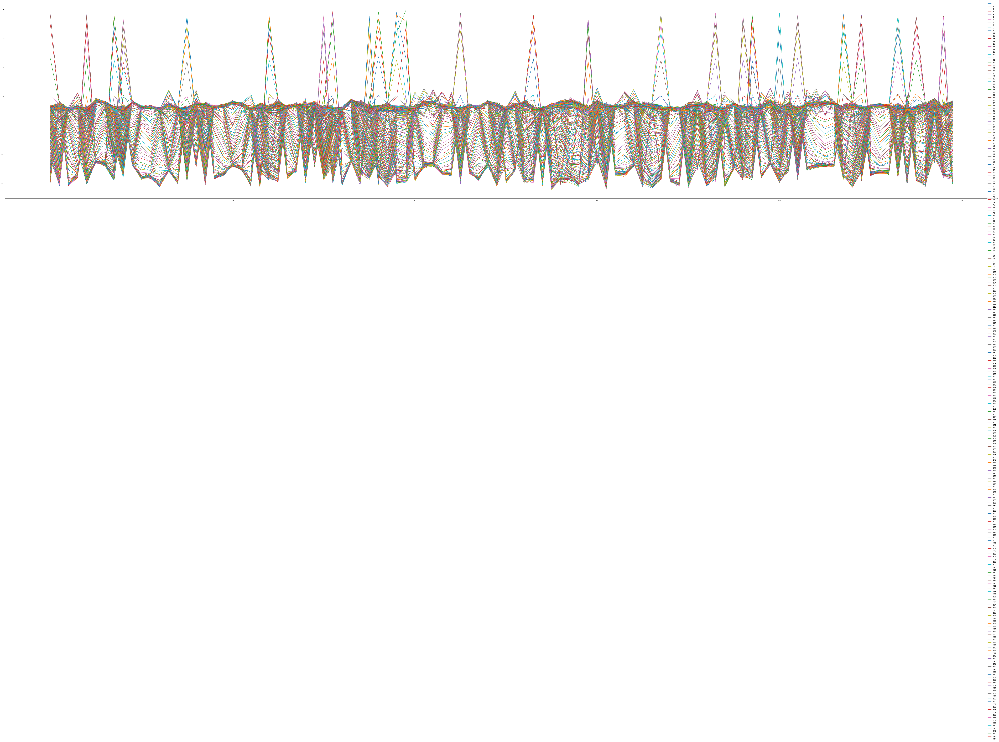

In [65]:
pd.DataFrame(CachedDatasets().load_dataset("Trace")[0][:,:,0]).plot(figsize=(100,20))

In [42]:

, y_train, X_test, y_test

(array([[[ 0.70284807],
         [ 0.67041062],
         [ 0.66094803],
         ...,
         [ 0.58290225],
         [ 0.5847045 ],
         [ 0.59973054]],
 
        [[ 0.78424784],
         [ 0.76968207],
         [ 0.73637576],
         ...,
         [ 0.79215738],
         [ 0.77039311],
         [ 0.78639174]],
 
        [[-1.45424119],
         [-1.47859826],
         [-1.50492559],
         ...,
         [ 0.72844694],
         [ 0.72533128],
         [ 0.7094401 ]],
 
        ...,
 
        [[ 0.75458352],
         [ 0.78165687],
         [ 0.80198359],
         ...,
         [ 0.74927489],
         [ 0.7479381 ],
         [ 0.74485583]],
 
        [[-1.38201243],
         [-1.35633753],
         [-1.37303456],
         ...,
         [ 0.76888577],
         [ 0.81197286],
         [ 0.83448894]],
 
        [[ 0.66455793],
         [ 0.56782604],
         [ 0.65111839],
         ...,
         [ 0.55524164],
         [ 0.55725016],
         [ 0.56296336]]]),
 array([1, 2, 4, 3,